##SHUBHAM BINDAL##

####Initially I used Mask RCNN for the semantic segmentation purpose, but its output is not the ideal one, as some background pixels were classified as foreground. So to solve this I used grabcut alogorithm on top of it and used mask returned by Mask RCNN as a seed to it, I didn't input the 'on mask' with pixel value '1', I made the 'on mask' pixel value '3' which is the probable foreground, if I didn't do this step, then grabcut might return the same mask as of mask rcnn. I also used the corresponding bbox returned by Mask RCNN as ROI rectangle for grabcut####

In [ ]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

Requirement already up-to-date: torch in /usr/local/lib/python3.6/dist-packages (1.5.1+cu101)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.6/dist-packages (0.6.1+cu101)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-ffo47qld
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-ffo47qld
     |████████████████████████████████| 276kB 4.2MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1-cp36-none-any.whl size=46457 sha256=901dfbc7570c4917130faae5e4e908ad7cecaa7ebc6fc01986fb58d56ff36b86
  Stored in directory: /tmp/pip-ephem-wheel-cache-sc5j9yvy/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
  Created wheel for pyyaml: filename=PyYAML-5.3.1-cp36-cp36m-linux_x86_64.whl size=44621 sha256=3d480666974da3bc7a62c05327acd1c8c2d66999b6f43c54a464d0bbaa7127c4
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
Successfully

'1.5.1+cu101'

In [ ]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 6127, done.
remote: Total 6127 (delta 0), reused 0 (delta 0), pack-reused 6127
Receiving objects: 100% (6127/6127), 2.79 MiB | 14.49 MiB/s, done.
Resolving deltas: 100% (4447/4447), done.
Obtaining file:///content/detectron2_repo
  Running setup.py develop for detectron2


In [1]:

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg


In [2]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x/138205316/model_final_a3ec72.pkl"  # initialize from model zoo


In [3]:
from detectron2.modeling import build_model
model = build_model(cfg)  

In [4]:
from detectron2.checkpoint import DetectionCheckpointer
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS) 

{'__author__': 'Detectron2 Model Zoo'}

In [5]:
model.eval()

GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2): Sequential(
        (0): BottleneckBlock

In [6]:
import numpy as np
import cv2 


def grabcut(img, final_mask):

  mask = final_mask[:,:,0].copy()

  bgdModel = np.zeros((1,65),np.float64)
  fgdModel = np.zeros((1,65),np.float64)

  x, y, w, h = bbox
  rect = (int(x),int(y), int(w)+1, int(h)+1)

  temp_mask = mask[int(y):int(y)+int(h)+1, int(x):int(x)+int(w)+1] == 1
  mask[int(y):int(y)+int(h)+1, int(x):int(x)+int(w)+1] = (temp_mask*3)       # made mask region probable foreground

  cv2.grabCut(img,mask, rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_MASK)
  mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')

  return mask2


In [7]:
def get_mask(image, mask, img_num):

  final_mask = np.zeros_like(image)

  for c in range(final_mask.shape[-1]):
    final_mask[:,:,c] = mask.copy()

  mask2 = grabcut(image, final_mask)

  mask2 = np.repeat(mask2[:, :, np.newaxis], 3, axis=2)
  mask2 = cv2.GaussianBlur(mask2, (3, 3), 0)
  alpha = mask2.astype(float) * 1.1  # making blend stronger
  alpha[mask2 > 0] = 255
  alpha[alpha > 255] = 255
  alpha = alpha.astype(float)

  foreground = np.copy(image).astype(float)
  foreground[mask2 == 0] = 0
  background = np.ones_like(foreground, dtype=float) * 255

  cv2.imwrite(f'/content/foreground/{img_num}.png', foreground)
  cv2.imwrite(f'/content/alpha/{img_num}.png', alpha)

  # Normalize the alpha mask to keep intensity between 0 and 1
  alpha = alpha / 255.0
  # Multiply the foreground with the alpha matte
  foreground = cv2.multiply(alpha, foreground)
  # Multiply the background with ( 1 - alpha )
  background = cv2.multiply(1.0 - alpha, background)
  # Add the masked foreground and background.
  cutout = cv2.add(foreground, background)

  cv2.imwrite(f'/content/background/{img_num}.png', background)

  cv2.imwrite(f'/content/cutout/{img_num}.png', cutout)

  return cutout


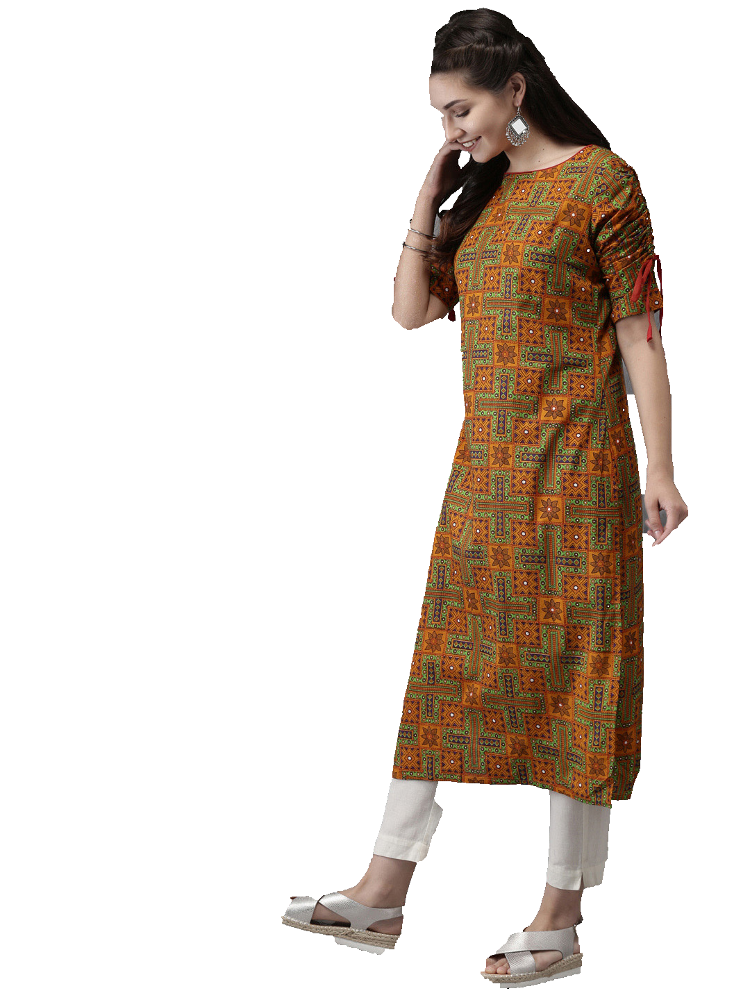

None

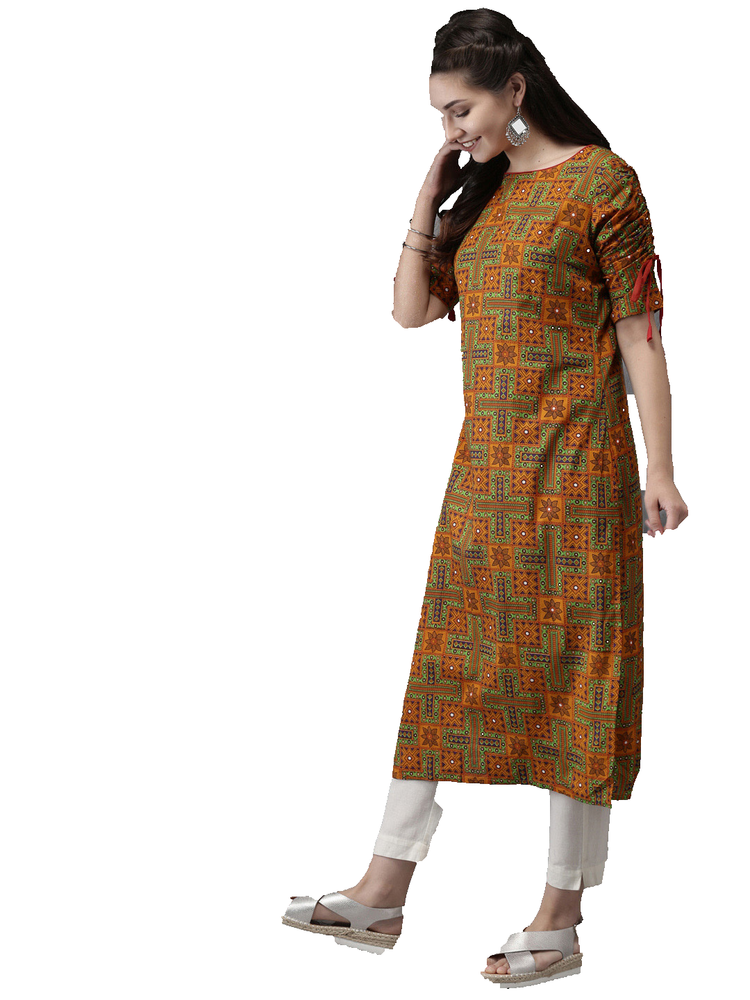

None

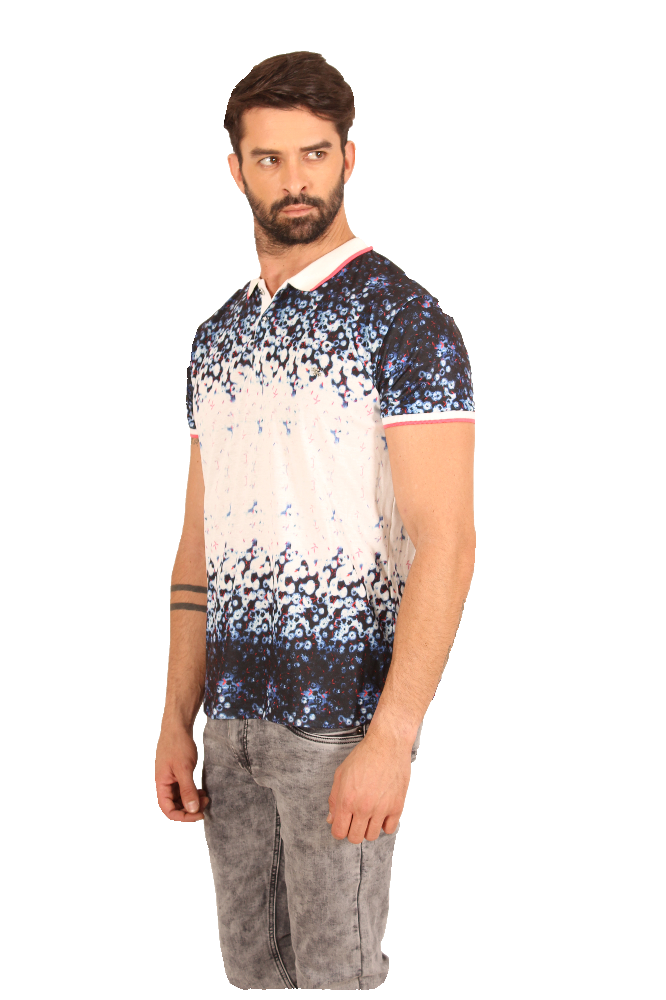

None

In [8]:
from PIL import Image

img_dir = '/content/img_folder'

img_num = 1

for img in os.listdir(img_dir):

  pred = DefaultPredictor(cfg)
  image = cv2.imread(os.path.join(img_dir, img))
  outputs = pred(image)

  bbox = outputs['instances'].get('pred_boxes').tensor.cpu().tolist()[0]

  mask = outputs['instances'].get('pred_masks').cpu().numpy()[0]

  final_image = get_mask(image.copy(), mask.copy(), img_num)

  img_num += 1

  display(cv2_imshow(final_image))